In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
df = pd.read_csv(r'C:\Users\ADMIN\Desktop\Cars24 E2E\code\Training_FileFromDB\InputFile.csv')
final_df = df.copy()
final_df.drop(final_df.columns[[0, 1, 5, 8, 9]], axis=1,inplace = True)
data = final_df.dropna()

In [3]:
def one_hot_encoding(df45):
    df55 = df45.copy()
    dfdummies = pd.get_dummies(data=df55,columns=['Transmission_Type','Ownership','Fuel_Used'],drop_first=True)
    return dfdummies

In [4]:
new_df = one_hot_encoding(data)
new_df.head(3)

,km_driven,selling_price,Age,"Transmission_Type_""Manual""","Ownership_""2nd Owner""","Ownership_""3rd Owner""","Ownership_""4th Owner""","Fuel_Used_""Petrol + CNG""","Fuel_Used_""Petrol + LPG""","Fuel_Used_""Petrol"""
0,46245,432499,7,1,0,0,0,0,0,0
1,95779,383499,10,1,0,0,0,0,0,1
2,12761,371599,10,1,0,1,0,0,0,1


In [5]:
X=new_df.iloc[:,[0,2,3,4,5,6,7,8,9]]
y=new_df.iloc[:,1]

In [3]:
X

NameError: name 'X' is not defined

In [6]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [7]:
result_df = pd.DataFrame(index=X_test.index, columns=['Lasso','Ridge','LR','XGBRegressor','RFRegressor','DT','Actual'])

In [8]:
result_df.Actual = y_test

##### Lasso Regression

In [9]:
# Lasso Regularization
# LassoCV will return best alpha and coefficients after performing 10 cross validations
lasscv = LassoCV(alphas = None,cv =10, max_iter = 100000)
lasscv.fit(StandardScaler().fit_transform(X_train),y_train)

LassoCV(cv=10, max_iter=100000)

In [10]:
#StandardScaler().fit_transform(X_train),y_train

In [11]:
# best alpha parameter
alpha = lasscv.alpha_
alpha

137.31792066810863

In [12]:
#now that we have best parameter, let's use Lasso regression and see how well our data has fitted before
lasso_reg = Lasso(alpha)
lasso_reg.fit(X_train,y_train)

Lasso(alpha=137.31792066810863)

In [13]:
lasso_reg.score(X_test, y_test)

0.4031882292820059

In [14]:
result_df.Lasso =lasso_reg.predict(X_test)

In [15]:
result_df['|Lasso-Actual|'] = abs(result_df.Lasso-result_df.Actual)

In [16]:
#result_df

#### Proceeding with Ridge Regression

In [2]:
import numpy as np

In [1]:
# Using Ridge regression model
# RidgeCV will return best alpha and coefficients after performing 10 cross validations. 
# We will pass an array of random numbers for ridgeCV to select best alpha from them

alphas = np.random.uniform(low=0, high=10, size=(50,))
ridgecv = RidgeCV(alphas = alphas,cv=10)
ridgecv.fit(StandardScaler().fit_transform(X_train),y_train)

NameError: name 'np' is not defined

In [18]:
#print(sklearn.__version__)
#import sklearn
#print('sklearn: %s' % sklearn.__version__)
ridgecv.alpha_

9.944890593867171

In [19]:
ridge_model = Ridge(alpha=ridgecv.alpha_)
ridge_model.fit(X_train, y_train)

Ridge(alpha=9.944890593867171)

In [20]:
ridge_model.score(X_test, y_test)

0.4025756632841305

In [21]:
result_df.Ridge = ridge_model.predict(X_test)

In [22]:
result_df['|Ridge-Actual|'] = abs(result_df.Ridge-result_df.Actual)

In [23]:
result_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,Actual,|Lasso-Actual|,|Ridge-Actual|
541,589848.178125,587600.241534,NaN,NaN,NaN,NaN,385999,203849.178125,201601.241534
1878,588471.710482,589572.563909,NaN,NaN,NaN,NaN,524799,63672.710482,64773.563909
3856,520108.479081,521111.377254,NaN,NaN,NaN,NaN,309599,210509.479081,211512.377254
534,600398.846629,597168.600243,NaN,NaN,NaN,NaN,416099,184299.846629,181069.600243
3118,275350.686202,277409.447345,NaN,NaN,NaN,NaN,419199,143848.313798,141789.552655
...,...,...,...,...,...,...,...,...,...
960,525467.174998,529191.792294,NaN,NaN,NaN,NaN,515599,9868.174998,13592.792294
348,601690.511820,603957.413534,NaN,NaN,NaN,NaN,740399,138708.488180,136441.586466
1389,329532.817001,332185.987747,NaN,NaN,NaN,NaN,275799,53733.817001,56386.987747
4419,581221.204396,582997.109184,NaN,NaN,NaN,NaN,699699,118477.795604,116701.890816


#### Decision Tree Regressor

In [24]:
from sklearn.tree import DecisionTreeRegressor
from dmba import plotDecisionTree

In [25]:
#let's first visualize the tree on the data without doing any pre processing
clf = DecisionTreeRegressor()
clf.fit(X_train,y_train)

DecisionTreeRegressor()

In [26]:
plotDecisionTree(clf, feature_names=X_train.columns, rotate=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.451504 to fit



In [27]:
tree_reg = DecisionTreeRegressor().fit(X_train, y_train)
print("The model training score is" , tree_reg.score(X_train, y_train))

The model training score is 0.9998565194422292


In [28]:
y_pred_tree = tree_reg.predict(X_test)

In [29]:
result_df['DT'] = clf.predict(X_test)
result_df['|DT-Actual|'] = abs(result_df.DT-result_df.Actual)

In [30]:
result_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,Actual,|Lasso-Actual|,|Ridge-Actual|,|DT-Actual|
541,589848.178125,587600.241534,NaN,NaN,NaN,447899.0,385999,203849.178125,201601.241534,61900.0
1878,588471.710482,589572.563909,NaN,NaN,NaN,524799.0,524799,63672.710482,64773.563909,0.0
3856,520108.479081,521111.377254,NaN,NaN,NaN,309599.0,309599,210509.479081,211512.377254,0.0
534,600398.846629,597168.600243,NaN,NaN,NaN,416099.0,416099,184299.846629,181069.600243,0.0
3118,275350.686202,277409.447345,NaN,NaN,NaN,397199.0,419199,143848.313798,141789.552655,22000.0
...,...,...,...,...,...,...,...,...,...,...
960,525467.174998,529191.792294,NaN,NaN,NaN,538699.0,515599,9868.174998,13592.792294,23100.0
348,601690.511820,603957.413534,NaN,NaN,NaN,740399.0,740399,138708.488180,136441.586466,0.0
1389,329532.817001,332185.987747,NaN,NaN,NaN,426499.0,275799,53733.817001,56386.987747,150700.0
4419,581221.204396,582997.109184,NaN,NaN,NaN,479199.0,699699,118477.795604,116701.890816,220500.0


In [31]:
metric_df = pd.DataFrame(index = ['ME','RMSE', 'MAE','MAPE'] ,
                         columns = ['Lasso','Ridge','LR','XGBRegressor','RFRegressor','DT'])

n_test = len(result_df)

for m in metric_df.columns:
    metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
    metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
    metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
    metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100
metric_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT
ME,209.950503,35.748869,0.0,0.0,0.0,1214.550265
RMSE,252251.479165,252380.901084,0.0,0.0,0.0,254938.560961
MAE,181415.198103,181051.420196,0.0,0.0,0.0,144418.677249
MAPE,30.575755,30.476061,0.0,0.0,0.0,23.482948


#### Tune DT

In [32]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion':['squared_error','friedman_mse','absolute_error'],
    'splitter' : ['best','random'],
    'max_depth': [10,20,30,40,50,60,70], 
    'min_samples_split': [5, 10,15,20,25 ,30,35 ,40], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01,0.1], 
}

gridSearch = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
gridSearch.fit(X_train, y_train)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  -56325523347.675766
Initial parameters:  {'criterion': 'squared_error', 'max_depth': 10, 'min_impurity_decrease': 0.001, 'min_samples_split': 20, 'splitter': 'random'}


In [35]:

param_grid = {
    'criterion':['squared_error'],
    'splitter' : ['random'],
    'max_depth': [6,7,8,10,12,14,16], 
    'min_samples_split': [10, 12, 14,16,18,20,22,24], 
    'min_impurity_decrease': [0.00001 , 0.00005, 0.0001, 0.0005,0.001,0.005,0.01], 
}

gridSearch = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
gridSearch.fit(X_train, y_train)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  -55536455058.86892
Initial parameters:  {'criterion': 'squared_error', 'max_depth': 7, 'min_impurity_decrease': 0.01, 'min_samples_split': 14, 'splitter': 'random'}


#### Tune for Randomness

In [36]:
# Create tuning (validation) set: devide the trainset

X_train_s, X_tune, y_train_s, y_tune = train_test_split(X_train, y_train, test_size=0.2, random_state=1)

print('X_train Shape: ', X_train.shape)
print('y_train Shape: ', y_train.shape)

print('X_train_s Shape: ', X_train_s.shape)
print('X_tune Shape: ', X_tune.shape)
print('y_train_s Shape: ', y_train_s.shape)
print('y_tune Shape: ', y_tune.shape)

X_train Shape:  (3776, 9)
y_train Shape:  (3776,)
X_train_s Shape:  (3020, 9)
X_tune Shape:  (756, 9)
y_train_s Shape:  (3020,)
y_tune Shape:  (756,)


In [40]:
n=len(y_tune)
random_options = range(1,100)

tune_df = pd.DataFrame(index = random_options,
                       columns=['RSME'])


for random_o in random_options:
    car_dt = DecisionTreeRegressor(criterion='squared_error', splitter='random', max_depth=7,
                           min_samples_split = 14, min_impurity_decrease = 0.01, random_state=random_o)
    car_dt.fit(X_train_s, y_train_s)
    y_tune_predict = car_dt.predict(X_tune)
    RSME = np.sqrt(np.sum((y_tune_predict - y_tune)**2)/n)
    tune_df.at[random_o,'RSME'] = RSME

In [41]:
tune_df.RSME.sort_values()

86    247885.418132
13    249519.216763
74    249548.247598
46     250242.36917
81    250919.257397
          ...      
60    270357.108617
54    272849.849213
87    273296.742755
96      273470.1034
14    276445.018223
Name: RSME, Length: 99, dtype: object

#### Tuned DT

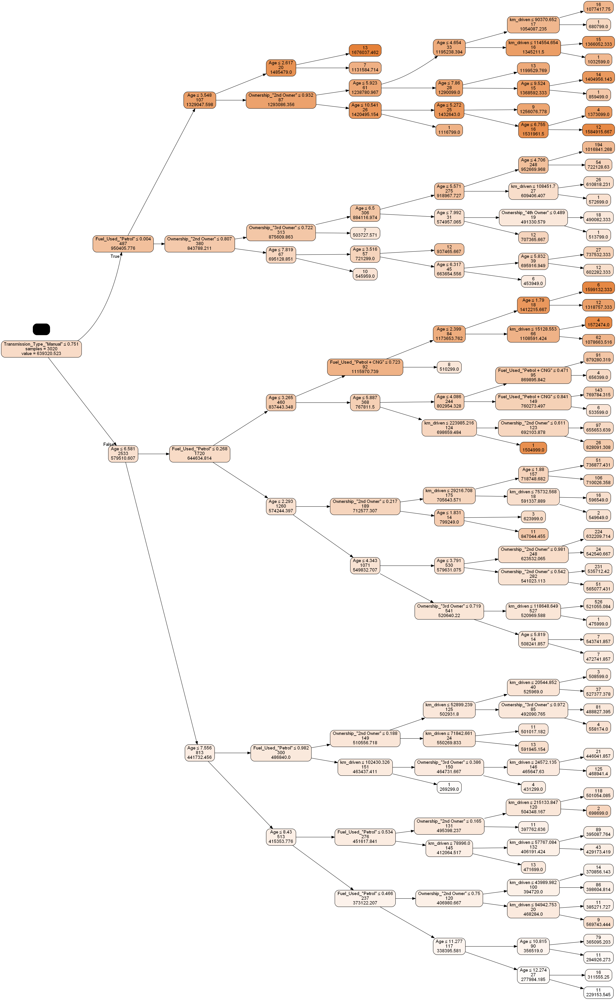

In [42]:
car_dt = DecisionTreeRegressor(criterion='squared_error', splitter='random', max_depth=7,
                           min_samples_split = 14, min_impurity_decrease = 0.01, random_state=86)
car_dt.fit(X_train_s, y_train_s)

plotDecisionTree(car_dt, feature_names=X_train.columns, rotate=True)

In [43]:
result_df['DT_tuned'] = car_dt.predict(X_test)
result_df['|DT_tuned-Actual|'] = abs(result_df.DT_tuned-result_df.Actual)

In [44]:
result_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,Actual,|Lasso-Actual|,|Ridge-Actual|,|DT-Actual|,DT_tuned,|DT_tuned-Actual|
541,589848.178125,587600.241534,NaN,NaN,NaN,447899.0,385999,203849.178125,201601.241534,61900.0,501054.084746,115055.084746
1878,588471.710482,589572.563909,NaN,NaN,NaN,524799.0,524799,63672.710482,64773.563909,0.0,535712.419913,10913.419913
3856,520108.479081,521111.377254,NaN,NaN,NaN,309599.0,309599,210509.479081,211512.377254,0.0,569743.444444,260144.444444
534,600398.846629,597168.600243,NaN,NaN,NaN,416099.0,416099,184299.846629,181069.600243,0.0,501054.084746,84955.084746
3118,275350.686202,277409.447345,NaN,NaN,NaN,397199.0,419199,143848.313798,141789.552655,22000.0,365095.202532,54103.797468
...,...,...,...,...,...,...,...,...,...,...,...,...
960,525467.174998,529191.792294,NaN,NaN,NaN,538699.0,515599,9868.174998,13592.792294,23100.0,521055.083650,5456.083650
348,601690.511820,603957.413534,NaN,NaN,NaN,740399.0,740399,138708.488180,136441.586466,0.0,565077.431373,175321.568627
1389,329532.817001,332185.987747,NaN,NaN,NaN,426499.0,275799,53733.817001,56386.987747,150700.0,395087.764045,119288.764045
4419,581221.204396,582997.109184,NaN,NaN,NaN,479199.0,699699,118477.795604,116701.890816,220500.0,535712.419913,163986.580087


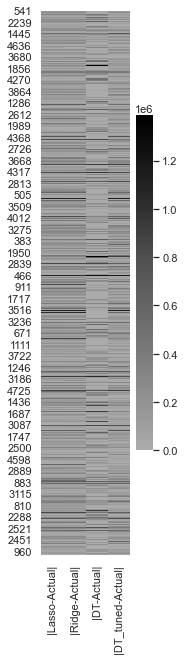

In [45]:
table = result_df[['|Lasso-Actual|','|Ridge-Actual|','|DT-Actual|','|DT_tuned-Actual|']]

plt.figure(figsize=(2,10))
sns.heatmap(table, center=table.mean().mean(),cmap="Greys")
plt.show()

In [46]:
m='DT_tuned'

metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100

metric_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,DT_tuned
ME,209.950503,35.748869,0.0,0.0,0.0,1214.550265,-4219.164340
RMSE,252251.479165,252380.901084,0.0,0.0,0.0,254938.560961,232438.087655
MAE,181415.198103,181051.420196,0.0,0.0,0.0,144418.677249,158313.087021
MAPE,30.575755,30.476061,0.0,0.0,0.0,23.482948,25.630277


##### Implementing XGBoost Regressor

In [3]:
from xgboost import XGBRegressor

In [48]:
xg_reg = XGBRegressor()

In [49]:
xg_reg.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [51]:
result_df['XGBRegressor'] = xg_reg.predict(X_test)
result_df['|XGBRegressor-Actual|'] = abs(result_df.XGBRegressor-result_df.Actual)

In [52]:
result_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,Actual,|Lasso-Actual|,|Ridge-Actual|,|DT-Actual|,DT_tuned,|DT_tuned-Actual|,|XGBRegressor-Actual|
541,589848.178125,587600.241534,NaN,468422.81250,NaN,447899.0,385999,203849.178125,201601.241534,61900.0,501054.084746,115055.084746,82423.81250
1878,588471.710482,589572.563909,NaN,531362.00000,NaN,524799.0,524799,63672.710482,64773.563909,0.0,535712.419913,10913.419913,6563.00000
3856,520108.479081,521111.377254,NaN,341990.09375,NaN,309599.0,309599,210509.479081,211512.377254,0.0,569743.444444,260144.444444,32391.09375
534,600398.846629,597168.600243,NaN,475502.40625,NaN,416099.0,416099,184299.846629,181069.600243,0.0,501054.084746,84955.084746,59403.40625
3118,275350.686202,277409.447345,NaN,358683.12500,NaN,397199.0,419199,143848.313798,141789.552655,22000.0,365095.202532,54103.797468,60515.87500
...,...,...,...,...,...,...,...,...,...,...,...,...,...
960,525467.174998,529191.792294,NaN,594938.62500,NaN,538699.0,515599,9868.174998,13592.792294,23100.0,521055.083650,5456.083650,79339.62500
348,601690.511820,603957.413534,NaN,652615.43750,NaN,740399.0,740399,138708.488180,136441.586466,0.0,565077.431373,175321.568627,87783.56250
1389,329532.817001,332185.987747,NaN,416019.40625,NaN,426499.0,275799,53733.817001,56386.987747,150700.0,395087.764045,119288.764045,140220.40625
4419,581221.204396,582997.109184,NaN,452726.65625,NaN,479199.0,699699,118477.795604,116701.890816,220500.0,535712.419913,163986.580087,246972.34375


In [53]:
m='XGBRegressor'
for m in metric_df.columns:
    metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
    metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
    metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
    metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100
metric_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,DT_tuned
ME,209.950503,35.748869,0.0,-1355.795453,0.0,1214.550265,-4219.164340
RMSE,252251.479165,252380.901084,0.0,212461.056053,0.0,254938.560961,232438.087655
MAE,181415.198103,181051.420196,0.0,138783.082755,0.0,144418.677249,158313.087021
MAPE,30.575755,30.476061,0.0,23.00352,0.0,23.482948,25.630277


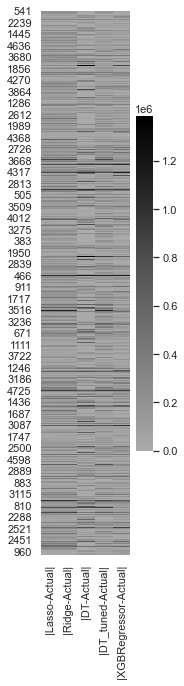

In [54]:
table = result_df[['|Lasso-Actual|','|Ridge-Actual|','|DT-Actual|','|DT_tuned-Actual|','|XGBRegressor-Actual|']]

plt.figure(figsize=(2,10))
sns.heatmap(table, center=table.mean().mean(),cmap="Greys")
plt.show()

In [55]:
result_df['|XGBRegressor-Actual|']

541      82423.81250
1878      6563.00000
3856     32391.09375
534      59403.40625
3118     60515.87500
            ...     
960      79339.62500
348      87783.56250
1389    140220.40625
4419    246972.34375
1483     73599.56250
Name: |XGBRegressor-Actual|, Length: 945, dtype: float64

##### Hypertune XGBoost Regressor

In [59]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV

In [60]:
params = { 'max_depth': [3, 5, 6, 10, 15, 20],
           'learning_rate': [0.01, 0.1, 0.2, 0.3],
           'subsample': np.arange(0.5, 1.0, 0.1),
           'colsample_bytree': np.arange(0.4, 1.0, 0.1),
           'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
           'n_estimators': [100, 500, 1000]}
xgbr = xgb.XGBRegressor(seed = 20)
clf = RandomizedSearchCV(estimator=xgbr,
                         param_distributions=params,
                         scoring='neg_mean_squared_error',
                         n_iter=25,
                         verbose=1)
clf.fit(X_train, y_train)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best parameters: {'subsample': 0.8999999999999999, 'n_estimators': 100, 'max_depth': 20, 'learning_rate': 0.2, 'colsample_bytree': 0.4, 'colsample_bylevel': 0.7999999999999999}
Lowest RMSE:  225112.03933857806


In [64]:
params = { 'max_depth': [15,17,20,22],
           'learning_rate': [0.15,0.18,0.2,0.22,0.24],
           'subsample': np.arange(0.7, 0.9, 0.090),
           'colsample_bytree': np.arange(0.1,0.4,0.01),
           'colsample_bylevel': np.arange(0.6,0.8,0.09),
           'n_estimators': [90,100,150,200]}
xgbr = xgb.XGBRegressor(seed = 20)
clf = RandomizedSearchCV(estimator=xgbr,
                         param_distributions=params,
                         scoring='neg_mean_squared_error',
                         n_iter=25,
                         verbose=1)
clf.fit(X_train, y_train)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best parameters: {'subsample': 0.7, 'n_estimators': 150, 'max_depth': 17, 'learning_rate': 0.15, 'colsample_bytree': 0.3999999999999998, 'colsample_bylevel': 0.7799999999999999}
Lowest RMSE:  229025.28361876644


In [65]:
result_df['XGB_tuned'] = clf.predict(X_test)
result_df['|XGB_tuned-Actual|'] = abs(result_df.XGB_tuned-result_df.Actual)

In [72]:
m='XGB_tuned'
metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100
metric_df

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,DT_tuned,XGB_tuned
ME,209.950503,35.748869,0.0,-1355.795453,0.0,1214.550265,-4219.164340,-5871.448710
RMSE,252251.479165,252380.901084,0.0,212461.056053,0.0,254938.560961,232438.087655,222188.209837
MAE,181415.198103,181051.420196,0.0,138783.082755,0.0,144418.677249,158313.087021,150782.340146
MAPE,30.575755,30.476061,0.0,23.00352,0.0,23.482948,25.630277,25.196010


In [71]:
metric_df.columns

Index(['Lasso', 'Ridge', 'LR', 'XGBRegressor', 'RFRegressor', 'DT',
       'DT_tuned'],
      dtype='object')

In [73]:
result_df.head(5)

,Lasso,Ridge,LR,XGBRegressor,RFRegressor,DT,Actual,|Lasso-Actual|,|Ridge-Actual|,|DT-Actual|,DT_tuned,|DT_tuned-Actual|,|XGBRegressor-Actual|,XGB_tuned,|XGB_tuned-Actual|
541,589848.178125,587600.241534,NaN,468422.81250,NaN,447899.0,385999,203849.178125,201601.241534,61900.0,501054.084746,115055.084746,82423.81250,534862.06250,148863.06250
1878,588471.710482,589572.563909,NaN,531362.00000,NaN,524799.0,524799,63672.710482,64773.563909,0.0,535712.419913,10913.419913,6563.00000,544683.06250,19884.06250
3856,520108.479081,521111.377254,NaN,341990.09375,NaN,309599.0,309599,210509.479081,211512.377254,0.0,569743.444444,260144.444444,32391.09375,360047.71875,50448.71875
534,600398.846629,597168.600243,NaN,475502.40625,NaN,416099.0,416099,184299.846629,181069.600243,0.0,501054.084746,84955.084746,59403.40625,485693.31250,69594.31250
3118,275350.686202,277409.447345,NaN,358683.12500,NaN,397199.0,419199,143848.313798,141789.552655,22000.0,365095.202532,54103.797468,60515.87500,328947.93750,90251.06250


In [2]:
import pickle

model_filename = "XGBoost.sav"

xg_boost_model = pickle.load(open(r'C:\Users\ADMIN\Desktop\Cars24 E2E\code\models\XGBoost\XGBoost.sav', 'rb'))

result = xg_boost_model.predict([[2000,3,100000,0,0,0,0,0,0,1]])

result

ValueError: training data did not have the following fields: km_driven, Age, MRP, Transmission_Type_" Manual", Ownership_"2nd Owner", Ownership_"3rd Owner", Ownership_"4th Owner", Fuel_Used_" Petrol + CNG", Fuel_Used_" Petrol + LPG", Fuel_Used_" Petrol"

In [6]:
test = pd.DataFrame(columns = ["""km_driven""",""" Age""", """MRP""", """Transmission_Type_" Manual" """, """Ownership_"2nd Owner" """, """ Ownership_"3rd Owner" """, """ Ownership_"4th Owner"  """, """Fuel_Used_" Petrol + CNG" """, """Fuel_Used_" Petrol + LPG"  """, """Fuel_Used_" Petrol"  """])

In [7]:
test

,km_driven,Age,MRP,"Transmission_Type_"" Manual""","Ownership_""2nd Owner""","Ownership_""3rd Owner""","Ownership_""4th Owner""","Fuel_Used_"" Petrol + CNG""","Fuel_Used_"" Petrol + LPG""","Fuel_Used_"" Petrol"""


In [8]:
test.insert(10,2,55555,0,1,0,0,0,0,0)

TypeError: insert() takes from 4 to 5 positional arguments but 11 were given

In [9]:
test.loc[len(test)] = [10,2,55555,0,1,0,0,0,0,0]

In [10]:
test

,km_driven,Age,MRP,"Transmission_Type_"" Manual""","Ownership_""2nd Owner""","Ownership_""3rd Owner""","Ownership_""4th Owner""","Fuel_Used_"" Petrol + CNG""","Fuel_Used_"" Petrol + LPG""","Fuel_Used_"" Petrol"""
0,10,2,55555,0,1,0,0,0,0,0


In [11]:
dtypes = numpy.dtype(
    [
        ("a", str),
        ("b", int),
        ("c", float),
        ("d", numpy.datetime64),
    ]
)
df = pandas.DataFrame(numpy.empty(0, dtype=dtypes))

ValueError: DataFrame.dtypes for data must be int, float, bool or category.  When
categorical type is supplied, DMatrix parameter `enable_categorical` must
be set to `True`. Invalid columns:km_driven,  Age, MRP, Transmission_Type_" Manual" , Ownership_"2nd Owner" ,  Ownership_"3rd Owner" ,  Ownership_"4th Owner"  , Fuel_Used_" Petrol + CNG" , Fuel_Used_" Petrol + LPG"  , Fuel_Used_" Petrol"  

In [43]:
x_t = pd.DataFrame([[9577900,12,350000,0,1,0,0,0,0,1]])

In [44]:
xg_boost_model.predict(x_t)[0]

310633.25